# Bivariate Time-Series Exploratory Analysis


In [92]:
# ============================================================
# Bivariate Time-Series Exploratory & Statistical Screening
# ============================================================
# Purpose:
#  - Systematically explore all bivariate relationships among SUM measures
#  - Screen for short-run co-movement, lead–lag effects, and long-run equilibrium
#  - Control for multiple testing (BH–FDR)
#  - Retain only statistically meaningful relationships for deeper modeling
# ============================================================

import itertools
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

from scipy.stats import pearsonr
from statsmodels.tsa.stattools import grangercausalitytests, coint, adfuller
from statsmodels.tsa.api import VAR
from statsmodels.stats.multitest import multipletests
from statsmodels.tsa.vector_ar.vecm import VECM, select_coint_rank
from statsmodels.stats.outliers_influence import variance_inflation_factor


In [94]:
# ------------------------------------------------------------
# 0. INPUTS
# ------------------------------------------------------------
MEASURES = [
    'HAC_dist', 'BAD', 'FAR', 'SHD',
    'groceries_ws', 'transit_ws',
    'int_den025', 'nd_deg025',
    'int_den05', 'nd_deg05',
    'int_den075', 'nd_deg075',
    'int_den10', 'nd_deg10',
    'COMPACTNESS_SUM'
]

YEAR_MIN = 1990
YEAR_MAX = 2023
MAX_LAG = 3
MIN_N = 12
ALPHA = 0.05

In [95]:
# ------------------------------------------------------------
# 1. LOAD & AGGREGATE DATA
# ------------------------------------------------------------
ABT = gpd.read_file(
    "../../../../Data/Final_dataset/ABT/ABT.gpkg",
    layer="subdivisions"
)

ABT = ABT[(ABT["year"] >= YEAR_MIN) & (ABT["year"] <= YEAR_MAX)]

# Yearly mean time series
ts_df = (
    ABT
    .groupby("year")[MEASURES]
    .mean()
    .sort_index()
)
ts_df.index = pd.to_datetime(ts_df.index, format="%Y")
ts_df = ts_df.asfreq("YS")  # Year-start frequency

In [96]:
# ------------------------------------------------------------
# 2. STATIONARITY PRE-SCREEN (ADF)
# ------------------------------------------------------------
def adf_flag(series, alpha=0.05):
    """
    Returns True if series is likely I(1) (non-stationary in levels),
    based on ADF test.
    """
    series = series.dropna()
    if len(series) < 10:
        return np.nan
    try:
        pval = adfuller(series, autolag="AIC")[1]
        return pval > alpha
    except Exception:
        return np.nan


integration_order = {
    m: adf_flag(ts_df[m])
    for m in MEASURES
}

integration_order = pd.Series(integration_order, name="is_I1")
integration_order


HAC_dist           False
BAD                 True
FAR                 True
SHD                  NaN
groceries_ws       False
transit_ws          True
int_den025          True
nd_deg025           True
int_den05           True
nd_deg05            True
int_den075          True
nd_deg075           True
int_den10           True
nd_deg10            True
COMPACTNESS_SUM     True
Name: is_I1, dtype: object

In [97]:
# ------------------------------------------------------------
# 3. VISUAL BIVARIATE EXPLORATION (CALLED LATER ON SHORTLIST)
# ------------------------------------------------------------
def plot_bivariate_pair(ts_df, x, y):
    df = ts_df[[x, y]].dropna()
    if len(df) < MIN_N:
        return

    years = df.index

    zx = (df[x] - df[x].mean()) / df[x].std(ddof=0)
    zy = (df[y] - df[y].mean()) / df[y].std(ddof=0)

    ddf = df.diff().dropna()

    fig, axes = plt.subplots(3, 1, figsize=(10, 9))

    # Levels
    axes[0].plot(years, zx, label=x)
    axes[0].plot(years, zy, label=y)
    axes[0].set_title(f"Standardized Levels: {x} vs {y}")
    axes[0].legend()

    # First differences
    axes[1].plot(ddf.index, ddf[x], label=f"Δ{x}")
    axes[1].plot(ddf.index, ddf[y], label=f"Δ{y}")
    axes[1].axhline(0, color="grey", lw=0.8)
    axes[1].set_title("First Differences")
    axes[1].legend()

    # Phase plot
    sc = axes[2].scatter(zx, zy, c=years, cmap="viridis")
    axes[2].plot(zx, zy, alpha=0.3)
    axes[2].set_xlabel(f"z({x})")
    axes[2].set_ylabel(f"z({y})")
    axes[2].set_title("Phase Plot")
    plt.colorbar(sc, ax=axes[2], label="Year")

    plt.tight_layout()
    plt.show()


In [98]:
# ------------------------------------------------------------
# 4. HELPER: VAR-BASED LAG SELECTION (BIC)
# ------------------------------------------------------------
def select_lag_var_bic(df2, max_lag):
    """
    df2: DataFrame with two stationary series
    Returns optimal lag >= 1 based on VAR BIC
    """
    try:
        model = VAR(df2)
        sel = model.select_order(maxlags=max_lag)
        lag = int(sel.bic.idxmin())
        return max(lag, 1)
    except Exception:
        return None


In [99]:
# ------------------------------------------------------------
# 5. BIVARIATE STATISTICAL SCREENING
# ------------------------------------------------------------
results = []

for x, y in itertools.combinations(MEASURES, 2):

    df = ts_df[[x, y]].dropna()
    if len(df) < MIN_N:
        continue

    # ---- Short-run dynamics (first differences)
    ddf = df.diff().dropna()
    if len(ddf) < (MAX_LAG + 2):
        continue

    # ---- Correlation of changes
    r, p_corr = pearsonr(ddf[x], ddf[y])


    # ---- Granger causality (VAR-selected lag)
    def granger_pval(target, predictor):
        sub = ddf[[target, predictor]]
        lag = select_lag_var_bic(sub, MAX_LAG)
        if lag is None:
            return np.nan
        res = grangercausalitytests(sub, maxlag=lag, verbose=False)
        return res[lag][0]["ssr_ftest"][1]


    p_gc_x_to_y = granger_pval(y, x)
    p_gc_y_to_x = granger_pval(x, y)

    # ---- Cointegration only if both look I(1)
    if integration_order[x] and integration_order[y]:
        try:
            _, p_coint, _ = coint(df[x], df[y])
        except Exception:
            p_coint = np.nan
    else:
        p_coint = np.nan

    results.append({
        "X": x,
        "Y": y,
        "corr": r,
        "p_corr": p_corr,
        "p_gc_x_to_y": p_gc_x_to_y,
        "p_gc_y_to_x": p_gc_y_to_x,
        "p_coint": p_coint
    })

summary = pd.DataFrame(results)

In [100]:
# ------------------------------------------------------------
# 6. MULTIPLE-TESTING CORRECTION (BH–FDR)
# ------------------------------------------------------------
for col in ["p_corr", "p_gc_x_to_y", "p_gc_y_to_x", "p_coint"]:
    pvals = summary[col].values
    mask = ~np.isnan(pvals)
    adj = np.full_like(pvals, np.nan, dtype=float)
    if mask.sum() > 0:
        adj[mask] = multipletests(pvals[mask], method="fdr_bh")[1]
    summary[f"{col}_adj"] = adj

summary["sig_corr"] = summary["p_corr_adj"] < ALPHA
summary["sig_gc_x_to_y"] = summary["p_gc_x_to_y_adj"] < ALPHA
summary["sig_gc_y_to_x"] = summary["p_gc_y_to_x_adj"] < ALPHA
summary["sig_coint"] = summary["p_coint_adj"] < ALPHA

summary["KEEP"] = (
        summary["sig_corr"] |
        summary["sig_gc_x_to_y"] |
        summary["sig_gc_y_to_x"] |
        summary["sig_coint"]
)

## Interpreting Statistically Significant Bivariate Relationships

Following the bivariate statistical screening and multiple-testing correction, this step synthesizes the retained results into an interpretable summary of temporal relationships between pairs of SUM indicators. Rather than reporting isolated test statistics, each retained indicator pair is assigned a qualitative relationship label that reflects the *type of temporal interaction* detected between the two time series.

### Relationship Typology

For each indicator pair, four complementary temporal relationship types are evaluated:

1. **Short-run co-movement**  
   This label indicates that the first differences of the two indicators are significantly correlated after false-discovery-rate (FDR) correction. A significant short-run co-movement suggests that year-to-year changes in the two measures tend to move together, either in the same direction (positive correlation) or in opposite directions (negative correlation). This relationship captures contemporaneous or near-term co-evolution rather than long-run structural dependence.

2. **Directional lead–lag relationship (Granger causality)**  
   Directional arrows (e.g., *X → Y*) indicate statistically significant Granger causality from indicator *X* to indicator *Y*. This result implies that past values of *X* contain predictive information about future changes in *Y*, beyond what is explained by *Y*’s own history. Importantly, this interpretation is predictive rather than strictly causal and reflects temporal precedence within the observed system.

3. **Bidirectional interaction**  
   In cases where Granger causality is detected in both directions (*X → Y* and *Y → X*), the relationship is interpreted as a feedback mechanism in which the two indicators mutually influence each other over time.

4. **Long-run equilibrium (cointegration)**  
   This label indicates that the two indicators share a statistically significant cointegrating relationship, suggesting the presence of a stable long-run equilibrium despite short-run deviations. In this case, the indicators may drift apart temporarily but tend to revert toward a common long-term trajectory, consistent with structural or systemic constraints in urban development.

Each indicator pair may exhibit one or multiple relationship types simultaneously (e.g., both short-run co-movement and long-run equilibrium), reflecting the multifaceted nature of temporal interactions in urban morphology.

### Construction of the Summary Table

The final summary table retains only indicator pairs that exhibit at least one statistically significant relationship type after FDR correction. For each retained pair, the table reports:

- **X, Y**: the two SUM indicators under consideration  
- **corr**: the Pearson correlation coefficient of first differences, quantifying the strength and direction of short-run co-movement  
- **corr_sign**: a qualitative indication of whether the short-run association is positive or negative  
- **relation**: a synthesized textual description of all statistically significant temporal relationships detected for the pair

To aid interpretability, the table is sorted by the absolute magnitude of the short-run correlation, prioritizing indicator pairs with stronger contemporaneous dynamics.

Note: a pair is retained only if at least one of the following is statistically significant after BH–FDR correction:

short-run correlation (sig_corr)

Granger causality X → Y

Granger causality Y → X

cointegration


In [101]:
# ------------------------------------------------------------
# 7. INTERPRETABLE RELATION LABELING
# ------------------------------------------------------------
def relation_type(row):
    rel = []
    if row["sig_corr"]:
        rel.append("Short-run co-movement")
    if row["sig_gc_x_to_y"]:
        rel.append(f"{row['X']} → {row['Y']}")
    if row["sig_gc_y_to_x"]:
        rel.append(f"{row['Y']} → {row['X']}")
    if row["sig_coint"]:
        rel.append("Long-run equilibrium")
    return "; ".join(rel)


summary["relation"] = summary.apply(relation_type, axis=1)

final_table = (
    summary.loc[summary["KEEP"], ["X", "Y", "corr", "relation"]]
    .sort_values("corr", key=np.abs, ascending=False)
)

final_table["corr_sign"] = np.sign(final_table["corr"]).map({
    1: "Positive",
    -1: "Negative",
    0: "Zero"
})

final_table


,X,Y,corr,relation,corr_sign
82,int_den075,int_den10,0.979243,Short-run co-movement,Positive
86,nd_deg075,nd_deg10,0.964867,Short-run co-movement,Positive
56,int_den025,int_den05,0.927408,Short-run co-movement; Long-run equilibrium,Positive
77,nd_deg05,nd_deg075,0.922006,Short-run co-movement; Long-run equilibrium,Positive
71,int_den05,int_den075,0.897928,Short-run co-movement,Positive
...,...,...,...,...,...
41,groceries_ws,int_den075,0.362943,Short-run co-movement,Positive
47,transit_ws,nd_deg025,0.322413,Long-run equilibrium,Positive
87,nd_deg075,COMPACTNESS_SUM,0.315559,Long-run equilibrium,Positive
62,int_den025,COMPACTNESS_SUM,0.314290,Long-run equilibrium,Positive


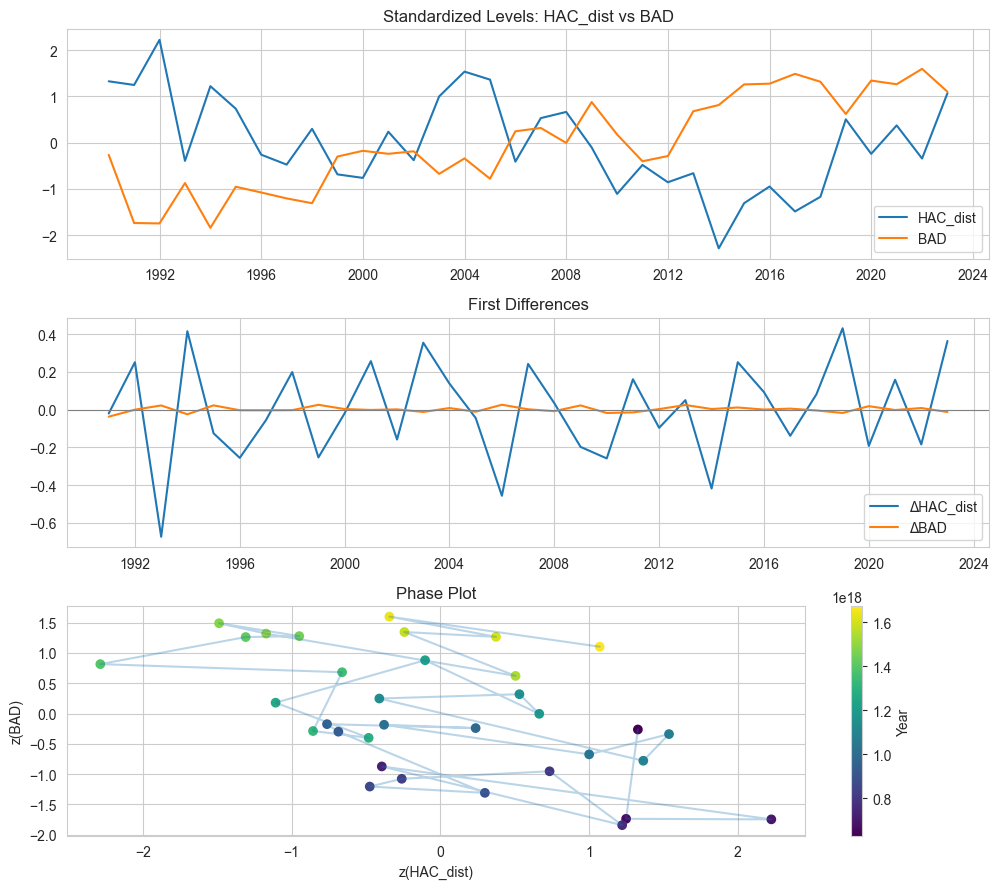

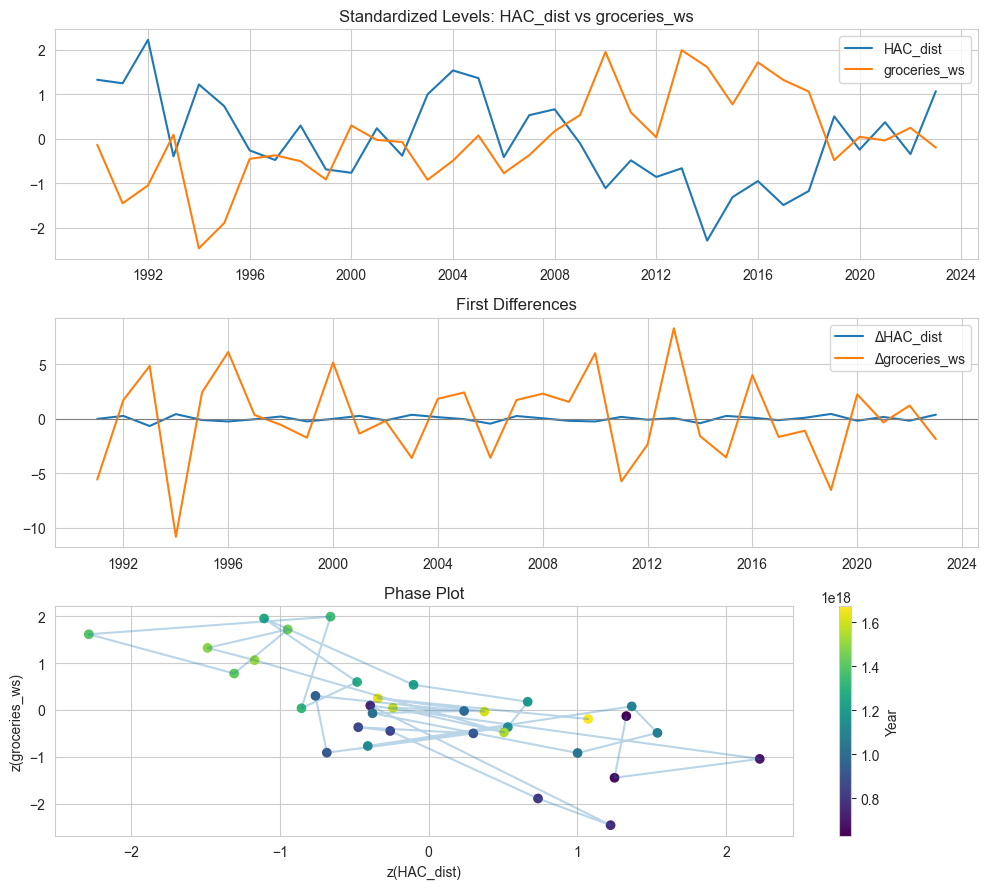

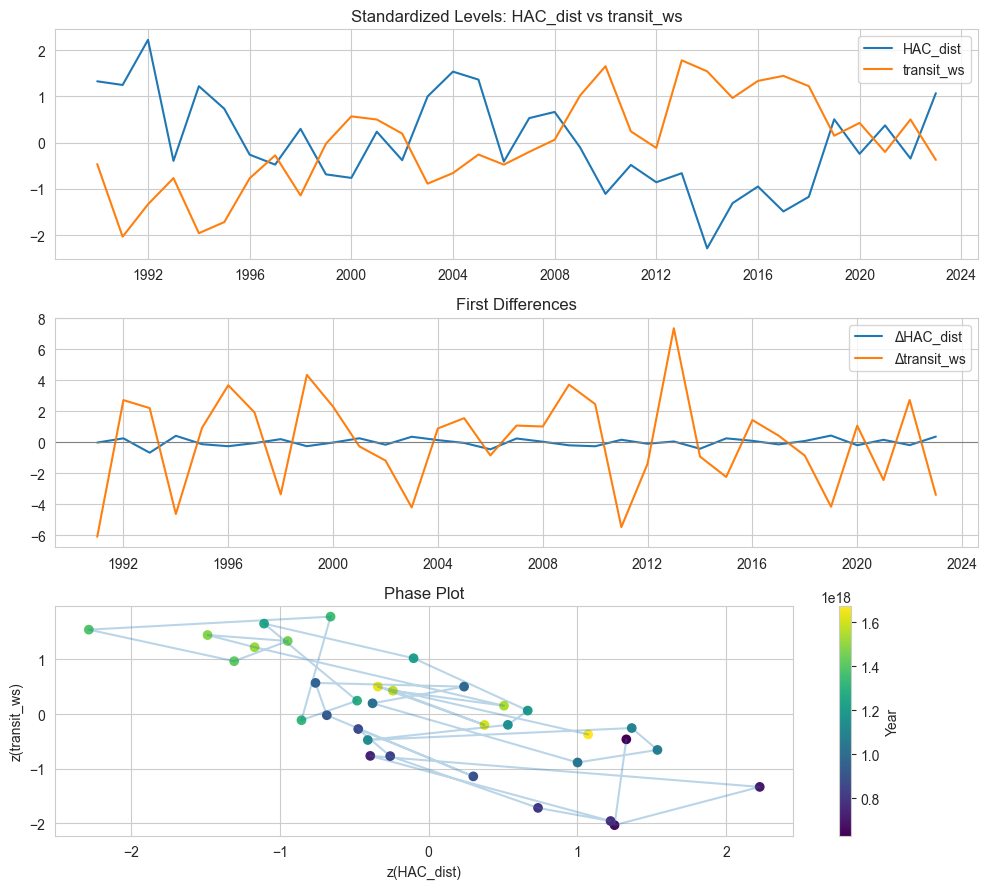

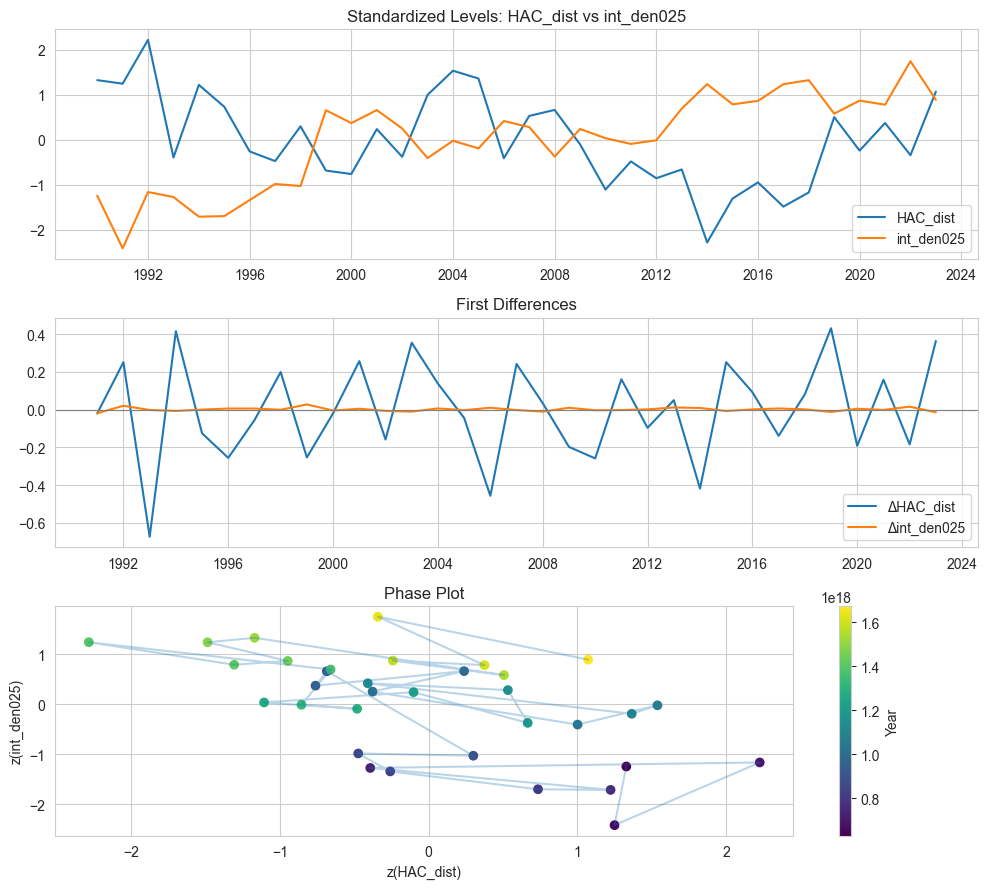

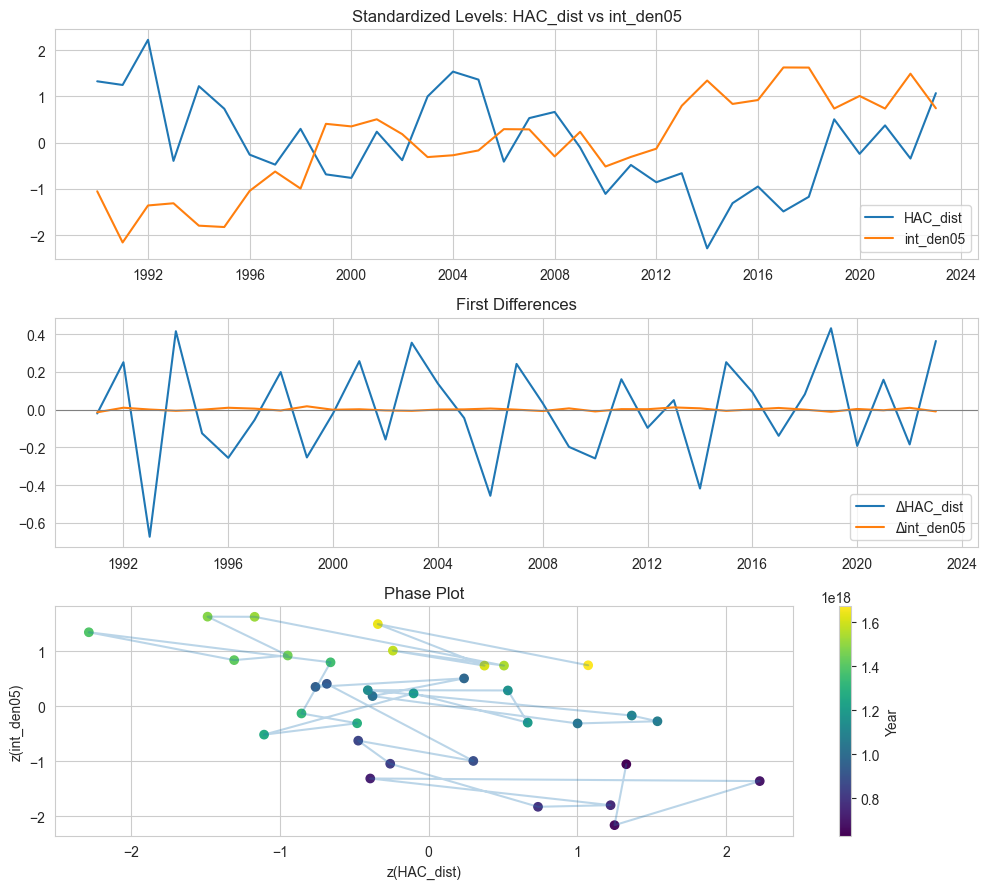

...

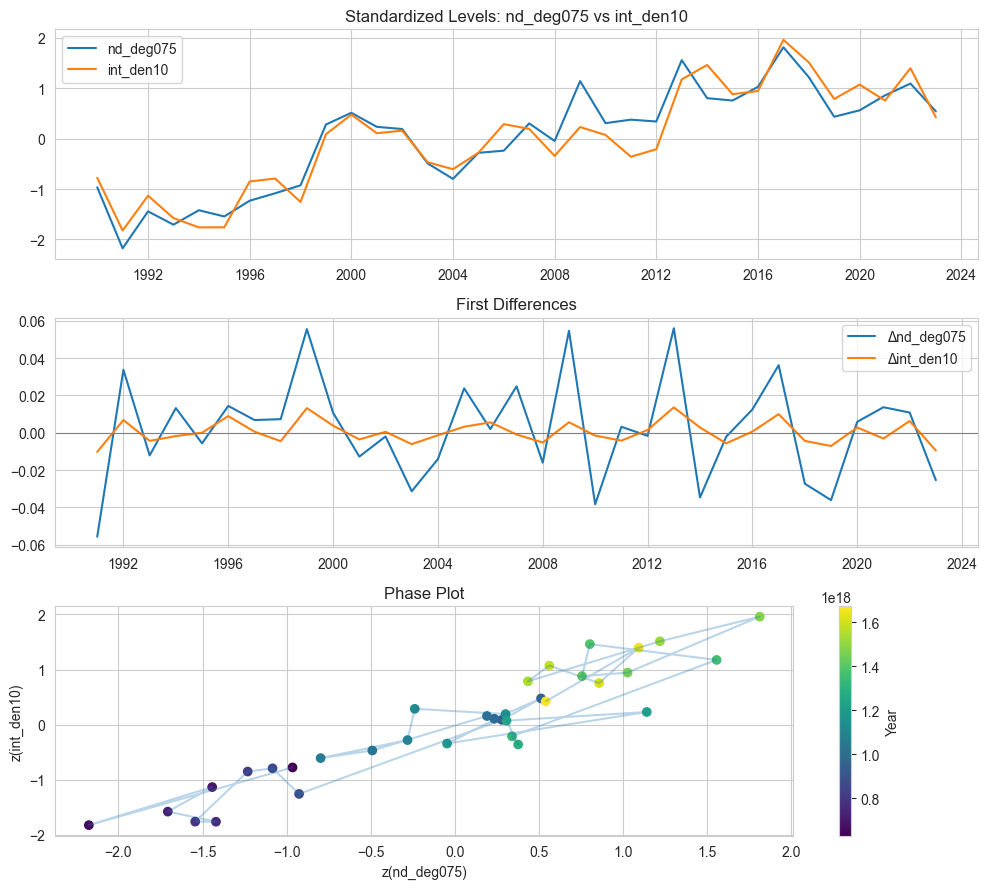

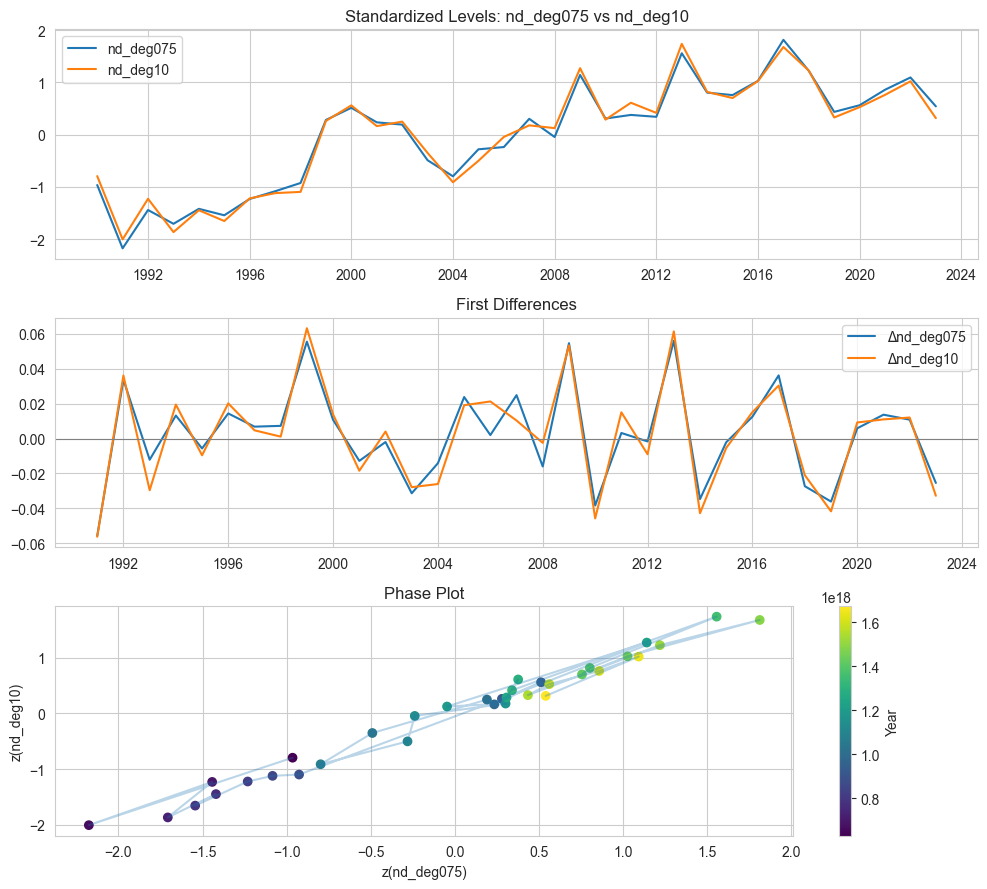

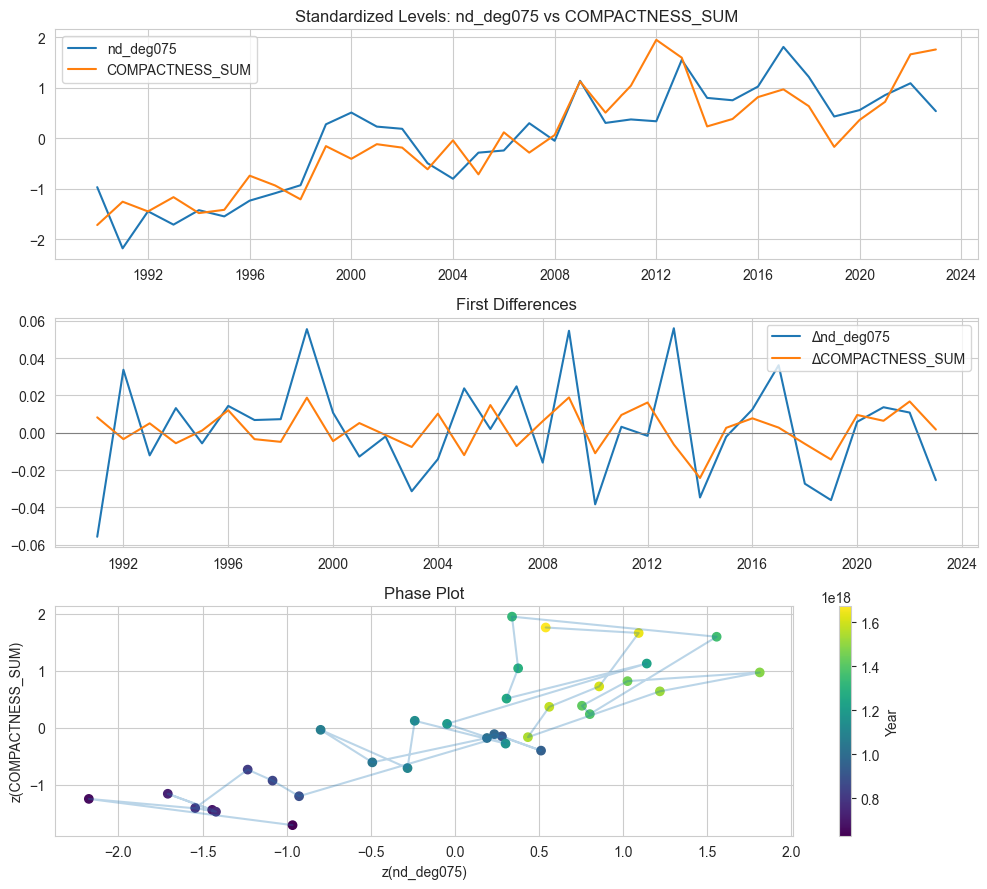

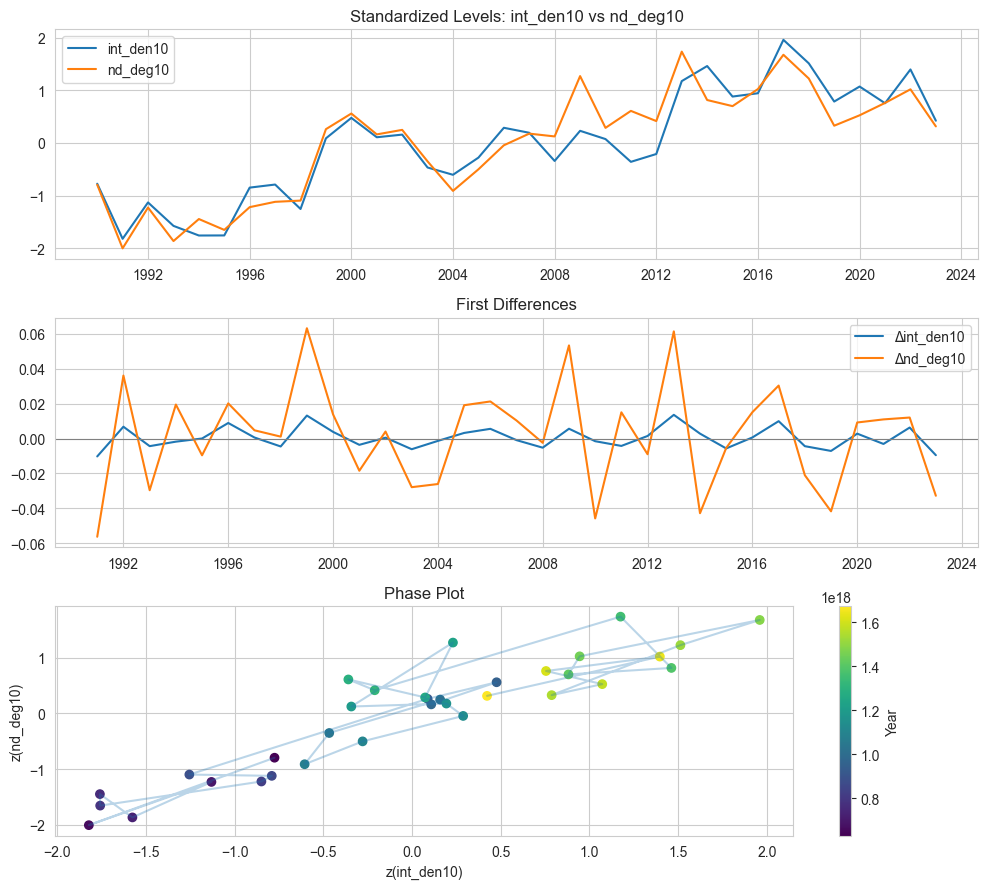

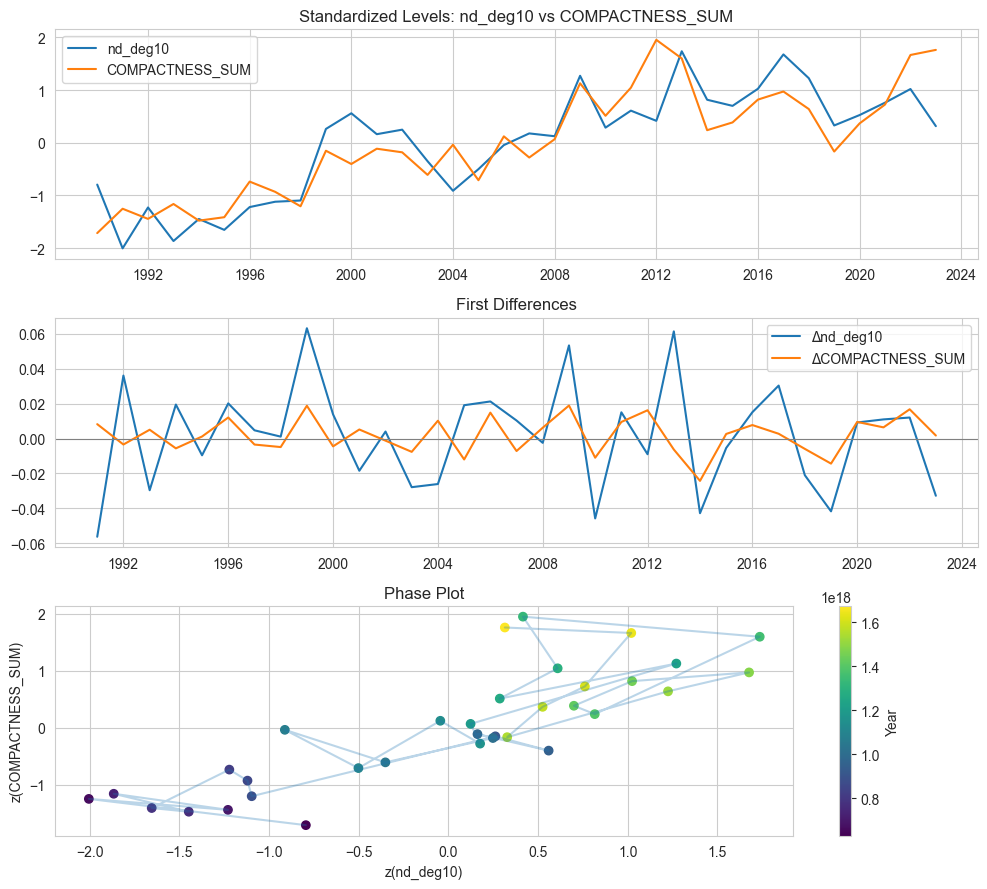

In [102]:
# ------------------------------------------------------------
# 8. VISUALIZE ONLY STATISTICALLY MEANINGFUL PAIRS
# ------------------------------------------------------------
kept_pairs = summary.loc[summary["KEEP"], ["X", "Y"]].values.tolist()

for x, y in kept_pairs:
    plot_bivariate_pair(ts_df, x, y)


# Confirmatory Modeling of Retained Bivariate Relationships

**Purpose**

The previous section identified statistically significant bivariate relationships using correlation, Granger causality, and cointegration tests with false-discovery-rate control.
This section moves beyond detection and estimates the dynamic structure of those relationships using formal time-series models. Specifically:

1. Indicator pairs exhibiting cointegration are modeled using a Vector Error Correction Model (VECM) to capture both long-run equilibrium and short-run adjustment dynamics.

2. Indicator pairs without cointegration are modeled using bivariate Vector Autoregression (VAR) on stationary series to quantify short-run interactions.

This step provides:

1. adjustment speeds (error correction terms),

2. dynamic feedback patterns,

3. impulse-response behavior,


which are not observable from statistical tests alone.

## Interpretation of Confirmatory Time-Series Models

Following bivariate screening, retained indicator pairs are modeled using formal multivariate time-series models to characterize their dynamic structure.

**Vector Error Correction Models (VECM)**  
For cointegrated indicator pairs, VECM estimation captures both short-run dynamics and long-run equilibrium adjustment. The estimated adjustment coefficients indicate which indicator responds more strongly when deviations from the long-run equilibrium occur, while the cointegrating vector summarizes the stable long-run relationship between the indicators. These results reveal how urban-form components co-adjust over time in the presence of structural constraints.

**Vector Autoregression (VAR)**  
For non-cointegrated pairs, VAR models fitted on stationary first differences quantify short-run interactions and feedback patterns. Cross-lag coefficients provide insight into how changes in one indicator propagate to another in subsequent periods, while lag selection based on information criteria ensures parsimonious specification.

Together, these models move beyond statistical detection and provide interpretable estimates of dynamic interdependence and temporal sequencing among SUM indicators.


In [103]:

bivariate_models = []

for _, row in summary.loc[summary["KEEP"]].iterrows():
    x, y = row["X"], row["Y"]
    df = ts_df[[x, y]].dropna()

    if len(df) < MIN_N:
        continue

    # -----------------------------
    # Cointegrated pairs → VECM
    # -----------------------------
    if row["sig_coint"]:
        try:
            rank_res = select_coint_rank(
                df,
                det_order=0,
                k_ar_diff=MAX_LAG,
                method="trace"
            )
            rank = rank_res.rank

            if rank > 0:
                vecm = VECM(
                    df,
                    k_ar_diff=1,
                    coint_rank=rank,
                    deterministic="co"
                ).fit()

                bivariate_models.append({
                    "X": x,
                    "Y": y,
                    "model": "VECM",
                    "coint_rank": rank,
                    "alpha_x": vecm.alpha[0, 0],
                    "alpha_y": vecm.alpha[1, 0],
                    "beta_x": vecm.beta[0, 0],
                    "beta_y": vecm.beta[1, 0]
                })

        except Exception:
            continue

    # -----------------------------
    # Non-cointegrated → VAR(Δ)
    # -----------------------------
    else:
        ddf = df.diff().dropna()
        if len(ddf) < MIN_N:
            continue

        try:
            lag = select_lag_var_bic(ddf, MAX_LAG)
            var = VAR(ddf).fit(lag)

            bivariate_models.append({
                "X": x,
                "Y": y,
                "model": "VAR",
                "lag": lag,
                "coef_x_on_y": var.params.loc[f"L1.{y}", x] if lag >= 1 else np.nan,
                "coef_y_on_x": var.params.loc[f"L1.{x}", y] if lag >= 1 else np.nan
            })

        except Exception:
            continue

bivariate_models_df = pd.DataFrame(bivariate_models)
bivariate_models_df


,X,Y,model,coint_rank,alpha_x,alpha_y,beta_x,beta_y
0,int_den075,nd_deg075,VECM,2,-0.546192,-0.404250,1.0,-5.126198e-17
1,nd_deg075,int_den10,VECM,2,0.006244,0.120716,1.0,-9.280791e-20


## Redundancy and Collinearity Diagnostics

Correlation and variance inflation factor (VIF) diagnostics reveal substantial redundancy among several retained indicators, particularly those measuring similar processes at multiple spatial buffers (e.g., density and network connectivity metrics). High pairwise correlations and elevated VIF values indicate overlapping information content rather than independent urban-form dynamics.

These findings caution against jointly including all retained indicators in multivariate time-series models, as doing so would risk unstable estimates and inflated uncertainty. Instead, the diagnostics motivate the extraction of a smaller number of latent trajectories using dimension-reduction techniques such as principal component analysis or dynamic factor models.

This approach enables parsimonious representation of dominant urban morphology trends while preserving the underlying temporal structure identified in the bivariate analysis.


In [104]:
# ============================================================
# 9. Redundancy and Collinearity Diagnostics
# ============================================================
# Purpose:
#  - Identify overlapping indicators
#  - Diagnose scale-driven redundancy
#  - Justify dimension reduction before multivariate modeling

### Interpretation
# Strong clusters are expected among indicators measuring
# similar processes at different spatial buffers (e.g., density,
# network connectivity). Such correlations indicate redundancy
# rather than independent urban-form dynamics.
# ============================================================

retained_vars = sorted(
    set(summary.loc[summary["KEEP"], "X"])
    | set(summary.loc[summary["KEEP"], "Y"])
)

retained_df = ts_df[retained_vars].dropna()

corr_matrix = retained_df.corr()
corr_matrix.round(2)

HIGH_CORR_THRESH = 0.85

high_corr_pairs = []

for i in range(len(corr_matrix)):
    for j in range(i + 1, len(corr_matrix)):
        r = corr_matrix.iloc[i, j]
        if abs(r) >= HIGH_CORR_THRESH:
            high_corr_pairs.append({
                "Var1": corr_matrix.index[i],
                "Var2": corr_matrix.columns[j],
                "corr": r
            })

high_corr_df = (
    pd.DataFrame(high_corr_pairs)
    .sort_values("corr", key=np.abs, ascending=False)
)

high_corr_df

,Var1,Var2,corr
22,int_den075,int_den10,0.993734
37,nd_deg075,nd_deg10,0.991817
16,int_den05,int_den075,0.987095
35,nd_deg05,nd_deg075,0.984345
9,int_den025,int_den05,0.980320
36,nd_deg05,nd_deg10,0.978297
17,int_den05,int_den10,0.975820
10,int_den025,int_den075,0.965341
11,int_den025,int_den10,0.949598
32,nd_deg025,nd_deg05,0.941325


In [105]:
### Diagnostic conclusion
# High VIF values confirm that several retained indicators
# encode overlapping information and should not be entered
# simultaneously into multivariate time-series models.
#
# This motivates the next analytical stage: extracting a smaller
# set of latent trajectories using dimension-reduction techniques.



vif_data = []
X = retained_df.values

for i, col in enumerate(retained_df.columns):
    vif_data.append({
        "variable": col,
        "VIF": variance_inflation_factor(X, i)
    })

vif_df = (
    pd.DataFrame(vif_data)
    .sort_values("VIF", ascending=False)
)

vif_df


,variable,VIF
11,nd_deg075,430284.182860
12,nd_deg10,321674.754048
10,nd_deg05,221459.406121
9,nd_deg025,63078.863988
8,int_den10,37367.128703
7,int_den075,31006.430164
6,int_den05,7039.404601
13,transit_ws,2338.132112
5,int_den025,2110.497539
4,groceries_ws,925.860274


In [108]:
!jupyter nbconvert --to html --no-input time_series_bivariate.ipynb --output ../../../../output/Notebook_Outputs/time_series/time_series_bivariate.html

[NbConvertApp] Converting notebook time_series_bivariate_1.ipynb to html
[NbConvertApp] Writing 13503166 bytes to ..\..\..\..\output\Notebook_Outputs\time_series\time_series_bivariate.html
